#### Author: Adam Van Etten - August 2022

# Test out the SAC approach

See if the Segment and Complete ([SAC](https://openaccess.thecvf.com/content/CVPR2022/html/Liu_Segment_and_Complete_Defending_Object_Detectors_Against_Adversarial_Patch_Attacks_CVPR_2022_paper.html)) approach works for us.  In brief, locate patches, set those pixels to 0, then run the test for car detection.

Assumes camouflage_VisDrone_04_apply_patches_to_test_set.ipynb has already been run.

In [1]:
from shapely.affinity import translate
from torchvision import transforms
from shapely.geometry import box
import matplotlib.pyplot as plt
from shapely.wkt import loads
from torch import autograd
import skimage.transform
import matplotlib as mpl
import geopandas as gpd
from torch import optim
from imp import reload
from tqdm import tqdm
import pandas as pd 
import numpy as np
import collections
import skimage.io
import operator
import shapely
import random
import inspect
import shutil
import torch
import math
import time
import imp
import cv2
import sys
import os
import gc
import PIL
import warnings
warnings.filterwarnings('ignore')

yoltv4_path = '/local_data/cosmiq/src/avanetten/yoltv4/'
sys.path.append(os.path.join(yoltv4_path, 'yoltv4'))
import prep_train
import tile_ims_labels
import post_process
import eval as yolt_eval
#import eval_errors

# camo src
camo_path = '/local_data/cosmiq/src/avanetten/camolo'
sys.path.append(os.path.join(camo_path, 'camolo'))
sys.path.append(os.path.join(camo_path, 'camolo', 'yolt_data_prep'))
# camo_path = '/local_data/cosmiq/src/avanetten/camouflage'
# sys.path.append(os.path.join(camo_path, 'data_prep'))
# sys.path.append(os.path.join(camo_path, 'adversarial-yolt'))
import cowc_yolt_prep
import utils as camo_utils
import prep_train as camo_prep_train
# import load_data
import patch_config
# import test_patch

# patch data
patch_data_root = '/local_data/cosmiq/src/avanetten/camolo/patches'
# patch_data_root = '/local_data/cosmiq/src/avanetten/camouflage/data/patches'

# set raw dataset path (gpu02)
data_root = '/local_data/cosmiq/wdata/avanetten/VisDrone/data'

# output dirs
train_root = os.path.join(data_root, 'VisDrone2019-DET-train')
val_root = os.path.join(data_root, 'VisDrone2019-DET-val')
test_root = os.path.join(data_root, 'VisDrone2019-DET-test-dev')
exp_name = 'v1_4cat'
print("test_root:", test_root)

import multiprocessing
from functools import partial
def map_wrapper(x):
    return x[0](*(x[1:]))

test_root: /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev


In [2]:
reload(patch_config)
patch_config.patch_configs

{'base': patch_config.BaseConfig,
 'exp1': patch_config.Experiment1,
 'exp1_des': patch_config.Experiment1Desktop,
 'exp2_high_res': patch_config.Experiment2HighRes,
 'exp3_low_res': patch_config.Experiment3LowRes,
 'exp4_class_only': patch_config.Experiment4ClassOnly,
 'paper_obj': patch_config.ReproducePaperObj,
 'cowc_obj_only_v4': patch_config.COWC_obj_only_v4,
 'cowc_obj_only_v3': patch_config.COWC_obj_only_v3,
 'cowc_obj_only_v2': patch_config.COWC_obj_only_v2,
 'cowc_obj_only_v1': patch_config.COWC_obj_only_v1,
 'cowc_obj_only': patch_config.COWC_obj_only,
 'visdrone_obj_only_v0': patch_config.visdrone_obj_only_v0,
 'visdrone_obj_class_v0': patch_config.visdrone_obj_class_v0,
 'visdrone_class_only_v0': patch_config.visdrone_class_only_v0,
 'visdrone_obj_only_small_v0': patch_config.visdrone_obj_only_small_v0,
 'visdrone_obj_only_small_gray_v0': patch_config.visdrone_obj_only_small_gray_v0,
 'visdrone_obj_only_small_gray_v1': patch_config.visdrone_obj_only_small_gray_v1,
 'visdro

model_list: ['visdrone_obj_only_v0', 'visdrone_obj_class_v0', 'visdrone_class_only_v0', 'visdrone_obj_only_small_v0', 'visdrone_obj_only_small_gray_v0', 'visdrone_obj_only_small_gray_v1', 'visdrone_v1_4cat_obj_only_small_v1', 'visdrone_v1_4cat_obj_class_small_v2', 'visdrone_v1_4cat_obj_only_v2', 'visdrone_v1_4cat_obj_only_gray_v2', 'visdrone_v1_4cat_obj_class_v3', 'visdrone_v1_4cat_obj_class_v4', 'visdrone_v1_4cat_obj_only_v4', 'visdrone_v1_4cat_obj_only_v5', 'visdrone_v1_4cat_obj_only_v5p1', 'visdrone_v1_4cat_obj_only_v5p2', 'visdrone_v1_4cat_obj_only_v5p3', 'visdrone_v1_4cat_obj_only_gray_v2p1', 'visdrone_v1_4cat_obj_only_gray_v2p2', 'visdrone_v1_4cat_obj_only_gray_v2p3', 'visdrone_v1_4cat_class_only_v1', 'visdrone_v1_4cat_obj_only_tiny_v0', 'visdrone_v1_4cat_obj_only_tiny_gray_v0', 'visdrone_v1_4cat_obj_only_tiny_gray_v1']
len model_list: 24
 & Name & Loss & Size & Alpha \\
1 & obj\_only\_v0 & obj & $0.2$ & $0.4$ \\
2 & obj\_class\_v0 & obj * cls & $0.2$ & $0.4$ \\
3 & class\_only\_

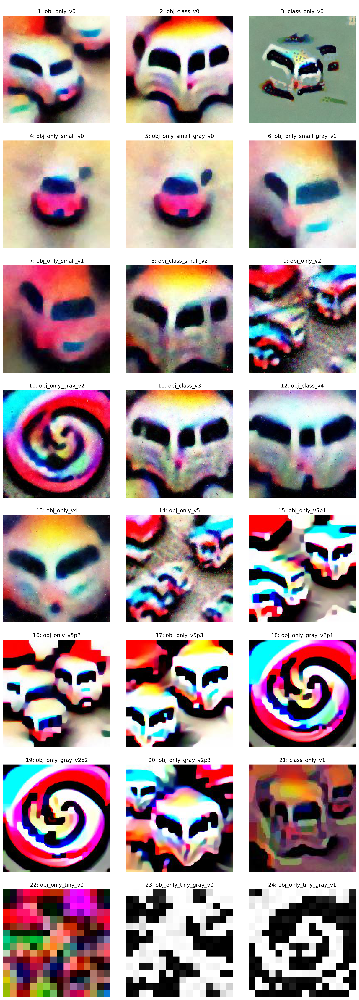

In [3]:
# View grid of latest patches, and plot patch params
plt.rcParams['figure.dpi'] = 300

model_list_full = list(patch_config.patch_configs.keys())
model_list = [z for z in model_list_full if z.startswith('visdrone')]
print("model_list:", model_list)
print("len model_list:", len(model_list))

# set up plot
ncols, figsize = 3, 4
nrows = int(len(model_list) / ncols)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols,  figsize=(figsize*ncols, 0.99*figsize*nrows))
    
sep = " & "
sep2 = ""
header = sep + "Name" + sep +  "Loss" + sep + "Size" + sep + "Alpha" + r" \\"
print(header)

for i, model in enumerate(model_list):
    print_name = model.split("visdrone_")[-1].split("v1_4cat_")[-1]
    print_name_tab = print_name.replace(r'_', r'\_')
    c = patch_config.patch_configs[model]()
    patch_dir = os.path.join(camo_path, 'saved_patches', c.patch_name)
    # patch_dir = os.path.join(camo_path, 'adversarial-yolt', 'saved_patches', config.patch_name)
    patch_list = sorted(os.listdir(patch_dir))
    epochs = [int(z.split('epoch')[-1].split('.')[0]) for z in patch_list if z.endswith('.jpg')]
    max_epoch = max(epochs)
    out_patch_path = os.path.join(patch_dir, c.patch_name + '_epoch{}.jpg'.format(str(max_epoch)))
    im = skimage.io.imread(out_patch_path)
    ax = axes.flatten()[i]
    ax.imshow(im)
    ax.set_title("\n" + str(i + 1) + ": " + print_name)
    ax.axis('off')
    # ax.set_title('{}: epoch={}'.format(model, epoch))    
    
    # plot details
    func = c.loss_target
    loss_str = inspect.getsource(func).split(": ")[-1].strip()
    tab_row = str(i+1) + sep + print_name_tab + sep + loss_str + sep \
              + "$" + str(c.target_size_frac) + "$" + sep \
              + "$" + str(c.patch_alpha) + "$" + r" \\"
    print(tab_row)

plt.tight_layout()
plt.savefig('patch_grid.png')


## Define models of interest

,model,label,name,path
0,visdrone_obj_only_v0,0,patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p...,/local_data/cosmiq/src/avanetten/camolo/saved_...
1,visdrone_obj_class_v0,1,patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p...,/local_data/cosmiq/src/avanetten/camolo/saved_...
2,visdrone_obj_only_small_v0,2,patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p...,/local_data/cosmiq/src/avanetten/camolo/saved_...
3,visdrone_v1_4cat_obj_only_small_v1,3,patch_yolt2_ave_26x26_alpha0p6_32vals_visdrone...,/local_data/cosmiq/src/avanetten/camolo/saved_...
4,visdrone_v1_4cat_obj_class_v3,4,patch_yolt2_ave_26x26_alpha0p6_32vals_visdrone...,/local_data/cosmiq/src/avanetten/camolo/saved_...
5,visdrone_v1_4cat_obj_only_v4,5,patch_yolt2_ave_26x26_alpha0p5_32vals_visdrone...,/local_data/cosmiq/src/avanetten/camolo/saved_...
6,visdrone_v1_4cat_obj_only_v5,6,patch_yolt2_ave_26x26_alpha0p5_32vals_visdrone...,/local_data/cosmiq/src/avanetten/camolo/saved_...
7,visdrone_v1_4cat_obj_only_v5p3,7,patch_yolt2_ave_26x26_alpha0p5_32vals_visdrone...,/local_data/cosmiq/src/avanetten/camolo/saved_...
8,visdrone_v1_4cat_obj_only_gray_v2p2,8,patch_yolt2_ave_26x26_alpha0p8_grays_visdrone_...,/local_data/cosmiq/src/avanetten/camolo/saved_...
9,visdrone_v1_4cat_obj_only_gray_v2p3,9,patch_yolt2_ave_26x26_alpha0p8_grays_visdrone_...,/local_data/cosmiq/src/avanetten/camolo/saved_...


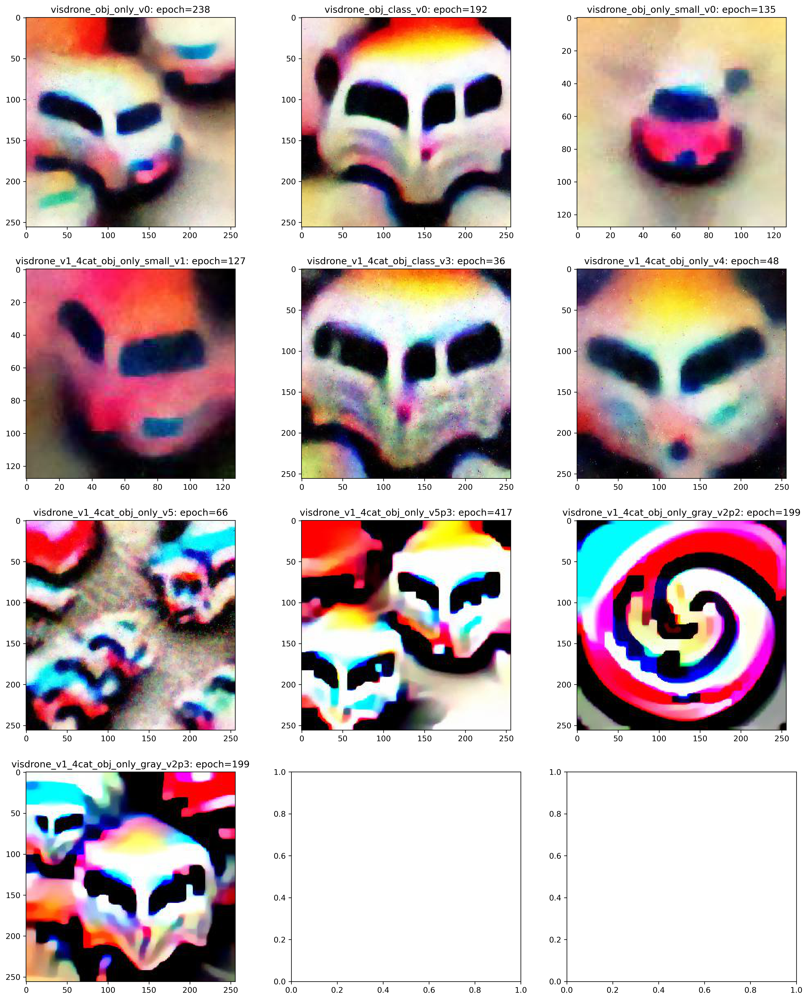

In [4]:
models_of_interest = [
 'visdrone_obj_only_v0',
 'visdrone_obj_class_v0',
 'visdrone_obj_only_small_v0',
 'visdrone_v1_4cat_obj_only_small_v1',
 'visdrone_v1_4cat_obj_class_v3',
 'visdrone_v1_4cat_obj_only_v4',
 'visdrone_v1_4cat_obj_only_v5',
 'visdrone_v1_4cat_obj_only_v5p3',
 'visdrone_v1_4cat_obj_only_gray_v2p2',
 'visdrone_v1_4cat_obj_only_gray_v2p3',
]

# define labels 
# View grid of latest patches (one plot per config)

# set up plot
ncols, figsize = 3, 6
nrows = math.ceil(len(models_of_interest) / ncols)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols,  figsize=(figsize*ncols, 0.95*figsize*nrows))
    
name_list, path_list = [], []
for i, model in enumerate(models_of_interest):
    ax = axes.flatten()[i]
    config = patch_config.patch_configs[model]()
    patch_dir = os.path.join(camo_path, 'saved_patches', config.patch_name)
    # patch_dir = os.path.join(camo_path, 'adversarial-yolt', 'saved_patches', config.patch_name)
    patch_list = sorted(os.listdir(patch_dir))
    epochs = [int(z.split('epoch')[-1].split('.')[0]) for z in patch_list if z.endswith('.jpg')]
    max_epoch = max(epochs)
    name = config.patch_name + '_epoch{}.jpg'.format(str(max_epoch))
    out_patch_path = os.path.join(patch_dir, name)
    name_list.append(name)
    path_list.append(out_patch_path)
    im = skimage.io.imread(out_patch_path)
    ax.imshow(im)
    ax.set_title('{}: epoch={}'.format(model, max_epoch))
    
# make a dataframe of patches of interest
# print("name_list:", name_list)
# print("path_list:", path_list)
df_patches = pd.DataFrame({'model': models_of_interest, 'label': range(len(name_list)), 'name': name_list, 'path': path_list})
display(df_patches)

In [6]:
# Get all patches

model_list_all = list(patch_config.patch_configs.keys())
model_list_visdrone = [z for z in model_list_all if z.startswith('visdrone')]
#model_list_visdrone = sorted([z for z in model_list_all if z.startswith('visdrone')])
# create list of all models, starting with models of interest
model_list_new = []
model_list_full = models_of_interest.copy()
for m in model_list_visdrone:
    if m not in models_of_interest:
        model_list_new.append(m)
        model_list_full.append(m)
print("model_list_new:", model_list_new)

# make df of patches (all models)
m_list, name_list, path_list = model_list_full, [], []
for i, model in enumerate(m_list):
    config = patch_config.patch_configs[model]()
    patch_dir = os.path.join(camo_path, 'saved_patches', config.patch_name)
    # patch_dir = os.path.join(camo_path, 'adversarial-yolt', 'saved_patches', config.patch_name)
    patch_list = sorted(os.listdir(patch_dir))
    epochs = [int(z.split('epoch')[-1].split('.')[0]) for z in patch_list if z.endswith('.jpg')]
    max_epoch = max(epochs)
    name = config.patch_name + '_epoch{}.jpg'.format(str(max_epoch))
    out_patch_path = os.path.join(patch_dir, name)
    name_list.append(name)
    path_list.append(out_patch_path)
df_patches_all = pd.DataFrame({'model': m_list, 'label': range(len(name_list)), 'name': name_list, 'path': path_list})

display(df_patches_all)

model_list_new: ['visdrone_class_only_v0', 'visdrone_obj_only_small_gray_v0', 'visdrone_obj_only_small_gray_v1', 'visdrone_v1_4cat_obj_class_small_v2', 'visdrone_v1_4cat_obj_only_v2', 'visdrone_v1_4cat_obj_only_gray_v2', 'visdrone_v1_4cat_obj_class_v4', 'visdrone_v1_4cat_obj_only_v5p1', 'visdrone_v1_4cat_obj_only_v5p2', 'visdrone_v1_4cat_obj_only_gray_v2p1', 'visdrone_v1_4cat_class_only_v1', 'visdrone_v1_4cat_obj_only_tiny_v0', 'visdrone_v1_4cat_obj_only_tiny_gray_v0', 'visdrone_v1_4cat_obj_only_tiny_gray_v1']


,model,label,name,path
0,visdrone_obj_only_v0,0,patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p...,/local_data/cosmiq/src/avanetten/camolo/saved_...
1,visdrone_obj_class_v0,1,patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p...,/local_data/cosmiq/src/avanetten/camolo/saved_...
2,visdrone_obj_only_small_v0,2,patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p...,/local_data/cosmiq/src/avanetten/camolo/saved_...
3,visdrone_v1_4cat_obj_only_small_v1,3,patch_yolt2_ave_26x26_alpha0p6_32vals_visdrone...,/local_data/cosmiq/src/avanetten/camolo/saved_...
4,visdrone_v1_4cat_obj_class_v3,4,patch_yolt2_ave_26x26_alpha0p6_32vals_visdrone...,/local_data/cosmiq/src/avanetten/camolo/saved_...
5,visdrone_v1_4cat_obj_only_v4,5,patch_yolt2_ave_26x26_alpha0p5_32vals_visdrone...,/local_data/cosmiq/src/avanetten/camolo/saved_...
6,visdrone_v1_4cat_obj_only_v5,6,patch_yolt2_ave_26x26_alpha0p5_32vals_visdrone...,/local_data/cosmiq/src/avanetten/camolo/saved_...
7,visdrone_v1_4cat_obj_only_v5p3,7,patch_yolt2_ave_26x26_alpha0p5_32vals_visdrone...,/local_data/cosmiq/src/avanetten/camolo/saved_...
8,visdrone_v1_4cat_obj_only_gray_v2p2,8,patch_yolt2_ave_26x26_alpha0p8_grays_visdrone_...,/local_data/cosmiq/src/avanetten/camolo/saved_...
9,visdrone_v1_4cat_obj_only_gray_v2p3,9,patch_yolt2_ave_26x26_alpha0p8_grays_visdrone_...,/local_data/cosmiq/src/avanetten/camolo/saved_...


In [7]:
model_list_full

['visdrone_obj_only_v0',
 'visdrone_obj_class_v0',
 'visdrone_obj_only_small_v0',
 'visdrone_v1_4cat_obj_only_small_v1',
 'visdrone_v1_4cat_obj_class_v3',
 'visdrone_v1_4cat_obj_only_v4',
 'visdrone_v1_4cat_obj_only_v5',
 'visdrone_v1_4cat_obj_only_v5p3',
 'visdrone_v1_4cat_obj_only_gray_v2p2',
 'visdrone_v1_4cat_obj_only_gray_v2p3',
 'visdrone_class_only_v0',
 'visdrone_obj_only_small_gray_v0',
 'visdrone_obj_only_small_gray_v1',
 'visdrone_v1_4cat_obj_class_small_v2',
 'visdrone_v1_4cat_obj_only_v2',
 'visdrone_v1_4cat_obj_only_gray_v2',
 'visdrone_v1_4cat_obj_class_v4',
 'visdrone_v1_4cat_obj_only_v5p1',
 'visdrone_v1_4cat_obj_only_v5p2',
 'visdrone_v1_4cat_obj_only_gray_v2p1',
 'visdrone_v1_4cat_class_only_v1',
 'visdrone_v1_4cat_obj_only_tiny_v0',
 'visdrone_v1_4cat_obj_only_tiny_gray_v0',
 'visdrone_v1_4cat_obj_only_tiny_gray_v1']

In [8]:
# new_list = ['visdrone_v1_4cat_obj_only_tiny_v0', 'visdrone_v1_4cat_obj_only_tiny_gray_v0']
new_list = ['visdrone_v1_4cat_obj_only_tiny_gray_v1']
df_patches_newnew = df_patches_all[df_patches_all['model'].isin(new_list)]
df_patches_newnew

,model,label,name,path
23,visdrone_v1_4cat_obj_only_tiny_gray_v1,23,patch_yolt2_ave_26x26_alpha0p75_visdrone_v1_4c...,/local_data/cosmiq/src/avanetten/camolo/saved_...


# Add patches to images 

## Make a test dir for each model

Apply the patch to all test images (multiprocess)

Already done in previous notebook (make_test_dir), outdir is:

    outdir = os.path.join(root, 'yolt', 'patches_applied', outname)



In [9]:
generic_label_int = 0
n_threads = 12
root = test_root
df_patch_tmp = df_patches_all

# create dict of patches
model_dict = {}
for idx, row in df_patch_tmp.iterrows():
    model_tmp = row['model']
    config = patch_config.patch_configs[model_tmp]()
    alpha = config.patch_alpha
    size = config.target_size_frac
    model_dict[model_tmp] = {'label': row['label'], 'path': row['path'], 
                         'alpha': alpha, 'size': size}
print("model_dict:", model_dict)


model_dict: {'visdrone_obj_only_v0': {'label': 0, 'path': '/local_data/cosmiq/src/avanetten/camolo/saved_patches/patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p4_30vals_obj_only_v0/patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p4_30vals_obj_only_v0_epoch238.jpg', 'alpha': 0.4, 'size': 0.2}, 'visdrone_obj_class_v0': {'label': 1, 'path': '/local_data/cosmiq/src/avanetten/camolo/saved_patches/patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p4_32vals_obj_class_v0/patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p4_32vals_obj_class_v0_epoch192.jpg', 'alpha': 0.4, 'size': 0.2}, 'visdrone_obj_only_small_v0': {'label': 2, 'path': '/local_data/cosmiq/src/avanetten/camolo/saved_patches/patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p3_30vals_obj_only_small_v0/patch_yolt2_ave_26x26_visdrone_v1_4cat_alpha0p3_30vals_obj_only_small_v0_epoch135.jpg', 'alpha': 0.3, 'size': 0.2}, 'visdrone_v1_4cat_obj_only_small_v1': {'label': 3, 'path': '/local_data/cosmiq/src/avanetten/camolo/saved_patches/patch_yolt2_ave_26x26

# Now apply patch detection model

Let us see how easy it is to detect the presence of each patch.

(Already done in prior notebook)

# Now score patch detection results

In [11]:
detection_thresh = 0.3
n_threads = 12
prediction_cat_attrib="category"
gt_cat_attrib='category_generic'

# for idx,row in df_patches_all.iterrows():
def score_one(model):
    print("\nModel:", model)

    outname = model + '_patches_applied_detect'
    
    config = patch_config.patch_configs[model]()
    target_size_frac = config.target_size_frac
    alpha = config.patch_alpha

    gt_polygons_dir = os.path.join(test_root, 'yolt', 'patches_applied', model, 'gdf')
    proposal_polygons_dir = os.path.join(yoltv4_path, 'darknet', 'results', outname, 
                                     'geojsons_pix_' + str(detection_thresh).replace('.', 'p'))  
    score_file = os.path.join(yoltv4_path, 'darknet', 'results', outname, 'scores_' + str(detection_thresh).replace('.', 'p') + '_v1.csv')  

    if os.path.exists(score_file):
        print("Score file exists, overwriting {}".format(score_file))
        # print("Score file exists, skipping {}".format(score_file))
        # return

    else: 
        print("Ground Truth:", gt_polygons_dir)
        print("Proposals:", proposal_polygons_dir, "\n")

        object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj,\
        precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences = \
            yolt_eval.mAP_score(proposal_polygons_dir, gt_polygons_dir,
                      prediction_cat_attrib=prediction_cat_attrib, gt_cat_attrib=gt_cat_attrib,
                      object_subset=[], threshold=0.5, confidence_attrib="prob",
                      file_format="geojson")
        print("object_subset:", object_subset)
        print("f1s_by_class:", f1s_by_class)
        print("mF1_score:", mF1_score)

        # create score df and file
        header = ['mF1'] + object_subset + ['target_size_frac', 'alpha']
        data = [mF1_score] + f1s_by_class + [target_size_frac, alpha]
        df_score = pd.DataFrame(columns=header, data=[data])
        df_score.to_csv(score_file)

##############
# multiprocess
    
# get args
input_args = []
# for idx,row in df_patches_all.iterrows():
for idx,row in df_patches_newnew.iterrows():
    model = row['model']
    input_args.append([score_one, model])

display(input_args)

with multiprocessing.Pool(n_threads) as pool:
    pool.map(map_wrapper, input_args)



[[<function __main__.score_one(model)>,
  'visdrone_v1_4cat_obj_only_tiny_gray_v1']]


Model: visdrone_v1_4cat_obj_only_tiny_gray_v1
Score file exists, overwriting /local_data/cosmiq/src/avanetten/yoltv4/darknet/results/visdrone_v1_4cat_obj_only_tiny_gray_v1_patches_applied_detect/scores_0p3_v1.csv


# Now extract the bounding boxes and create a new test set with the patch pixels zeroed out.

In [12]:
# First inspect predictions

model = 'visdrone_obj_only_v0'

# # for idx,row in df_patches_all.iterrows():
# for idx,row in df_patches_newnew.iterrows():
#     model = row['model']
#     input_args.append([score_one, model])


outname = model + '_patches_applied_detect'

config = patch_config.patch_configs[model]()
target_size_frac = config.target_size_frac
alpha = config.patch_alpha

gt_polygons_dir = os.path.join(test_root, 'yolt', 'patches_applied', model, 'gdf')
proposal_polygons_dir = os.path.join(yoltv4_path, 'darknet', 'results', outname, 
                                 'geojsons_pix_' + str(detection_thresh).replace('.', 'p'))  

print("proposal_polygons_dir:", proposal_polygons_dir)
        
samp_f = os.listdir(proposal_polygons_dir)[2]
samp_path = os.path.join(proposal_polygons_dir, samp_f)
print("samp_path:", samp_path)
print("cat samp_path:")
!cat {samp_path}

proposal_polygons_dir: /local_data/cosmiq/src/avanetten/yoltv4/darknet/results/visdrone_obj_only_v0_patches_applied_detect/geojsons_pix_0p3
samp_path: /local_data/cosmiq/src/avanetten/yoltv4/darknet/results/visdrone_obj_only_v0_patches_applied_detect/geojsons_pix_0p3/9999973_00000_d_0000150__x0_706_y0_353_dxdy_416.geojson
cat samp_path:
{
"type": "FeatureCollection",
"features": [
{ "type": "Feature", "properties": { "category": "patch", "prob": 0.917189 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 93.729218, 343.00827 ], [ 93.729218, 365.288055 ], [ 71.729507, 365.288055 ], [ 71.729507, 343.00827 ], [ 93.729218, 343.00827 ] ] ] } },
{ "type": "Feature", "properties": { "category": "patch", "prob": 0.907716 }, "geometry": { "type": "Polygon", "coordinates": [ [ [ 228.432129, 366.054504 ], [ 228.432129, 386.251465 ], [ 206.103851, 386.251465 ], [ 206.103851, 366.054504 ], [ 228.432129, 366.054504 ] ] ] } }
]
}


test_im_dir: /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/patches_applied/visdrone_obj_only_v0/images
samp_path: /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/patches_applied/visdrone_obj_only_v0/images/9999938_00000_d_0000274__x0_353_y0_353_dxdy_416.jpg


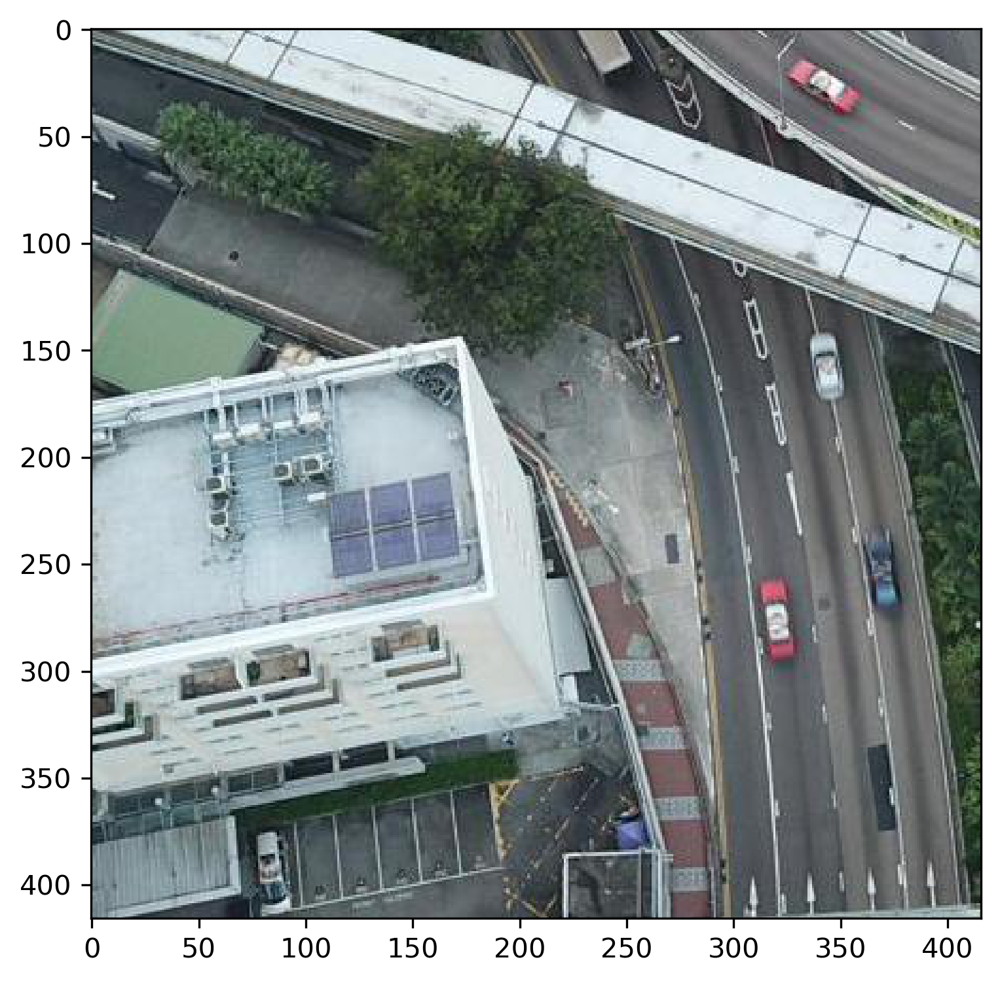

In [13]:
# view test dir

test_im_dir = os.path.join(root, 'yolt', 'patches_applied', model, 'images')
print("test_im_dir:", test_im_dir)

# view a sample
samp_f = os.listdir(test_im_dir)[3]
samp_path = os.path.join(test_im_dir, samp_f)
print("samp_path:", samp_path)
im = skimage.io.imread(samp_path)
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
_ = ax.imshow(im)


In [12]:
# filter out detected patches

n_threads = 12
patch_expansion_frac = 1.05
verbose = True
show = False

def scrub_one(model):
    # model = row['model']
    print("model:", model)
    
    test_im_dir = os.path.join(root, 'yolt', 'patches_applied', model, 'images')
    test_im_dir_filt = os.path.join(root, 'yolt', 'patches_applied', model, 'images_scrub')
    os.makedirs(test_im_dir_filt, exist_ok=True)
    print("test_im_dir_filt:", test_im_dir_filt)

    im_list = os.listdir(test_im_dir)
    for i, im_name in enumerate(im_list):

        if (i % 1000) == 0:
            print(i, "/", len(im_list))
        in_path = os.path.join(test_im_dir, im_name)
        out_path = os.path.join(test_im_dir_filt, im_name)
        pred_path = os.path.join(proposal_polygons_dir, im_name.split(".jpg")[0] + '.geojson')
        im = skimage.io.imread(in_path)
        im_out = im.copy()

        # ingest preds into df
        # df_tmp = pd.read_json(pred_path)
        df_tmp = gpd.read_file(pred_path)
        patch_geoms = df_tmp['geometry']

        # zero out pixels
        for geom in patch_geoms:
            minx0, miny0, maxx0, maxy0 = geom.bounds
            # expand area slightly to make sure we capture the entire patch
            xm, ym = 0.5 * (minx0 + maxx0), 0.5 * (miny0 + maxy0)
            dx0, dy0 = maxx0 - minx0, maxy0 - miny0
            dx, dy = patch_expansion_frac * dx0, patch_expansion_frac * dy0
            x0, x1 = max(0, int(xm - dx/2.0)), int(xm + dx/2.0)
            y0, y1 = max(0, int(ym - dy/2.0)), int(ym + dy/2.0)
            im_out[y0:y1, x0:x1, :] = 0
            # im_out[int(np.rint(miny)):int(np.rint(maxy)),int(np.rint(minx)):int(np.rint(maxx)),:] = 0

        # save output image
        skimage.io.imsave(out_path, im_out)

         # view?
        if (i == 0) and show:
            print("im.shape:", im.shape)
            # print("cat pred_path:")
            # !cat {pred_path}
            print("df_tmp:", df_tmp)
            print("patch_geoms[0]:", patch_geoms[0])
            print("patch_geoms[0].bounds:", patch_geoms[0].bounds)

            # plot
            im = skimage.io.imread(in_path)
            fig, (ax0, ax1) = plt.subplots(1, 2, figsize=(12, 6))
            _ = ax0.imshow(im)
            _ = ax1.imshow(im_out)

        # break

        
##############
# multiprocess
    
import multiprocessing
from functools import partial
def map_wrapper(x):
    return x[0](*(x[1:]))

# get args
input_args = []
for idx,row in df_patches_all.iterrows():
# for idx,row in df_patches_newnew.iterrows():
    model = row['model']
    input_args.append([scrub_one, model])
display(input_args)


with multiprocessing.Pool(n_threads) as pool:
     pool.map(map_wrapper, input_args)


[[<function __main__.scrub_one(model)>, 'visdrone_obj_only_v0'],
 [<function __main__.scrub_one(model)>, 'visdrone_obj_class_v0'],
 [<function __main__.scrub_one(model)>, 'visdrone_obj_only_small_v0'],
 [<function __main__.scrub_one(model)>, 'visdrone_v1_4cat_obj_only_small_v1'],
 [<function __main__.scrub_one(model)>, 'visdrone_v1_4cat_obj_class_v3'],
 [<function __main__.scrub_one(model)>, 'visdrone_v1_4cat_obj_only_v4'],
 [<function __main__.scrub_one(model)>, 'visdrone_v1_4cat_obj_only_v5'],
 [<function __main__.scrub_one(model)>, 'visdrone_v1_4cat_obj_only_v5p3'],
 [<function __main__.scrub_one(model)>, 'visdrone_v1_4cat_obj_only_gray_v2p2'],
 [<function __main__.scrub_one(model)>, 'visdrone_v1_4cat_obj_only_gray_v2p3'],
 [<function __main__.scrub_one(model)>, 'visdrone_class_only_v0'],
 [<function __main__.scrub_one(model)>, 'visdrone_obj_only_small_gray_v0'],
 [<function __main__.scrub_one(model)>, 'visdrone_obj_only_small_gray_v1'],
 [<function __main__.scrub_one(model)>, 'visd

model:model:model:model:model:model:model:model:model:model:model:model:            visdrone_obj_class_v0visdrone_obj_only_v0visdrone_v1_4cat_obj_only_v5visdrone_obj_only_small_v0visdrone_v1_4cat_obj_only_small_v1visdrone_v1_4cat_obj_only_v4visdrone_v1_4cat_obj_class_v3visdrone_v1_4cat_obj_only_v5p3visdrone_v1_4cat_obj_only_gray_v2p3visdrone_obj_only_small_gray_v0visdrone_class_only_v0visdrone_v1_4cat_obj_only_gray_v2p2











test_im_dir_filt:test_im_dir_filt:test_im_dir_filt:test_im_dir_filt:test_im_dir_filt:test_im_dir_filt:test_im_dir_filt:test_im_dir_filt:test_im_dir_filt:test_im_dir_filt:test_im_dir_filt: test_im_dir_filt:          /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/patches_applied/visdrone_obj_only_v0/images_scrub /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/patches_applied/visdrone_obj_class_v0/images_scrub/local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/patches_ap

test_im_dir: /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/patches_applied/visdrone_obj_only_v0/images_scrub
samp_path: /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/patches_applied/visdrone_obj_only_v0/images_scrub/9999938_00000_d_0000206__x0_353_y0_0_dxdy_416.jpg


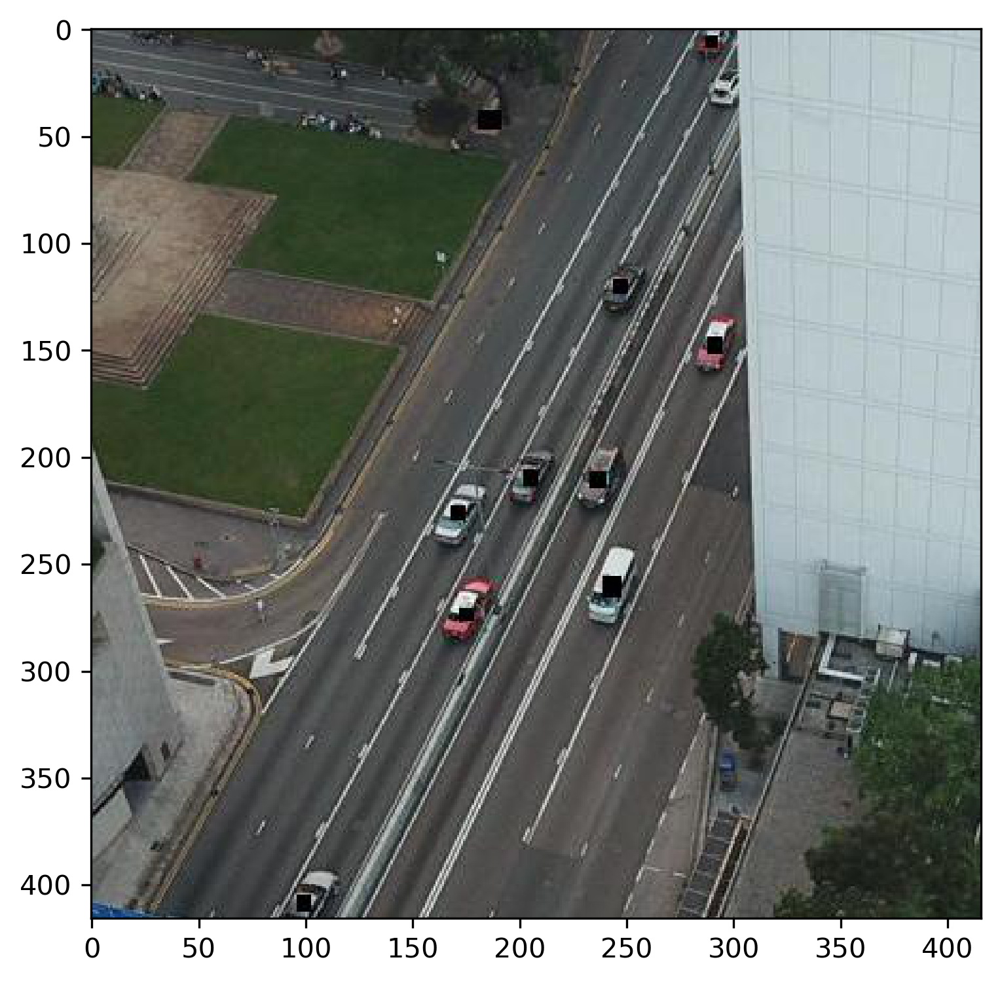

In [14]:
model = 'visdrone_obj_only_v0'

test_im_dir_tmp = os.path.join(root, 'yolt', 'patches_applied', model, 'images_scrub')
print("test_im_dir:", test_im_dir_tmp)

# view a sample
# samp_f = os.listdir(test_im_dir_tmp)[0]
samp_f = random.sample(os.listdir(test_im_dir_tmp), 1)[0]
samp_path = os.path.join(test_im_dir_tmp, samp_f)
print("samp_path:", samp_path)
im_tmp = skimage.io.imread(samp_path)
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
_ = ax.imshow(im_tmp)


In [15]:
# create .txt and .data files of image paths

exp_name = 'v1_4cat'
names_file = os.path.join(test_root, 'yolt', exp_name, 'txt', 'visdrone_v1_4cat.names')
classnum = 4
print("names_file:", names_file)
!echo {names_file}

roots = [test_root]
df_patches_tmp = df_patches_all
for root in roots:

    for idx,row in df_patches_tmp.iterrows():
        model = row['model']
        outname = model + '_scrub'
        print("\nModel:", model)
    
        # Define paths
        input_im_dir = os.path.join(root, 'yolt/v1_4cat/images')
        input_label_dir = os.path.join(root, 'yolt/v1_4cat/labels')

        outdir = os.path.join(root, 'yolt', 'patches_applied', model)
        outdir_txt = os.path.join(outdir, 'txt')
        outdir_images = os.path.join(outdir, 'images_scrub')
        outdir_labels = os.path.join(outdir, 'labels')
        outdir_gdf = os.path.join(outdir, 'gdf')
        outdir_labels_precise = os.path.join(outdir, 'labels_precise')
        outdir_gdf_precise = os.path.join(outdir, 'gdf_precise')

        # make list of images
        outpath_txt_tmp = os.path.join(outdir_txt, outname + '_imlist.txt')
        im_dir_tmp = outdir_images
        im_list = [os.path.join(im_dir_tmp, z) for z in os.listdir(im_dir_tmp) if z.endswith('.jpg')]
        df_tmp = pd.DataFrame({'image': im_list})
        df_tmp.to_csv(outpath_txt_tmp, header=False, index=False)
        print("\nOutpath:\n", outpath_txt_tmp)
        print("  N images:", len(df_tmp))

        # # make names file as well?
        # outpath_names = os.path.join(outdir_txt, outname + '.names')
        # print("  outpath_names:", outpath_names)
        # df_patches.sort_values('label').to_csv(outpath_names, index=False, 
        #                                        header=False, columns=['model'])
        
        # .data file
        outfile_data_test = os.path.join(outdir_txt, outname + '.data')

        # test
        !echo 'classes = ' {classnum} > {outfile_data_test}
        !echo 'train = "" '  >> {outfile_data_test}
        !echo 'valid = ' {outpath_txt_tmp} >> {outfile_data_test}
        !echo 'names = ' {names_file} >> {outfile_data_test}
        !echo 'backup = backup/' >> {outfile_data_test}

        print("\nhead:", outfile_data_test)
        !cat {outfile_data_test}


names_file: /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/v1_4cat/txt/visdrone_v1_4cat.names
/local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/v1_4cat/txt/visdrone_v1_4cat.names

Model: visdrone_obj_only_v0

Outpath:
 /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/patches_applied/visdrone_obj_only_v0/txt/visdrone_obj_only_v0_scrub_imlist.txt
  N images: 11236

head: /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/patches_applied/visdrone_obj_only_v0/txt/visdrone_obj_only_v0_scrub.data
classes =  4
train = "" 
valid =  /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/patches_applied/visdrone_obj_only_v0/txt/visdrone_obj_only_v0_scrub_imlist.txt
names =  /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/v1_4cat/txt/visdrone_v1_4cat.names
backup = backup/

Model: visdrone_obj_class_v0

Outpath:
 /local

In [27]:
# create testing commands
cfg_file = 'cfg/_backup/yolt2_ave_26x26_visdrone_v1_4cat.cfg'
weight_file = 'backup/yolt2_ave_26x26_visdrone_v1_4cat_final.weights'

root = test_root
df_patch_tmp = df_patches_all

# for idx,row in df_patches_all.iterrows():
for idx,row in df_patches_all.iterrows():
    model = row['model']
    outname = model + '_scrub'
    outname_yolt = model + '_patches_applied_scrub_'
    outdir = os.path.join(root, 'yolt', 'patches_applied', model)
    outdir_txt = os.path.join(outdir, 'txt')
    outfile_data_test = os.path.join(outdir_txt, outname + '.data')
    
    test_str = './darknet detector valid ' + outfile_data_test + ' ' \
        + cfg_file + ' ' + weight_file + ' ' \
        + '-out ' + outname_yolt
    
    print("\n#Model:", model)
    print("#test_str:\n")
    print(test_str)

print("\n#")


#Model: visdrone_obj_only_v0
#test_str:

./darknet detector valid /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/patches_applied/visdrone_obj_only_v0/txt/visdrone_obj_only_v0_scrub.data cfg/_backup/yolt2_ave_26x26_visdrone_v1_4cat.cfg backup/yolt2_ave_26x26_visdrone_v1_4cat_final.weights -out visdrone_obj_only_v0_patches_applied_scrub_

#Model: visdrone_obj_class_v0
#test_str:

./darknet detector valid /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/patches_applied/visdrone_obj_class_v0/txt/visdrone_obj_class_v0_scrub.data cfg/_backup/yolt2_ave_26x26_visdrone_v1_4cat.cfg backup/yolt2_ave_26x26_visdrone_v1_4cat_final.weights -out visdrone_obj_class_v0_patches_applied_scrub_

#Model: visdrone_obj_only_small_v0
#test_str:

./darknet detector valid /local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/patches_applied/visdrone_obj_only_small_v0/txt/visdrone_obj_only_small_v0_scrub.data cfg/_backup/yo

In [ ]:
# post process (multithread)
import warnings
warnings.filterwarnings('ignore')
reload(post_process)

n_threads = 12
extract_chips = False # True
detection_threshes = [0.3]  # [0.3, 0.35, 0.45]  #
slice_size = 0 # 416
sep = 'nope'
im_ext = '.jpg'
chip_ext = '.jpg'
show_labels = True
n_plots = 100
chip_rescale_frac = 1.1
allow_nested_detections = False # True
truth_file_name = '/local_data/cosmiq/wdata/avanetten/VisDrone/data/VisDrone2019-DET-test-dev/yolt/v1_4cat/gdf_pix_tot.geojson'
# truth_file_name = ''
verbose = False


def post_process_one(model, outname, outname0):
    
    print("outname:", outname)
    raw_im_dir = os.path.join(test_root, 'yolt', 'patches_applied', outname0, 'images_scrub')
    # proot = outname.split('yolt2_ave_26x26_visdrone_')[-1]
    # raw_im_dir = os.path.join(test_root, 'yolt', proot, 'images')
    for detection_thresh in detection_threshes:
        out_dir_root = os.path.join(yoltv4_path, 'darknet', 'results', outname)
        pred_dir = os.path.join(out_dir_root, 'orig_txt')
        out_csv = 'preds_refine_' + str(detection_thresh).replace('.', 'p') + '.csv'
        out_geojson_geo_dir = 'geojsons_geo_' + str(detection_thresh).replace('.', 'p')
        out_geojson_pix_dir = 'geojsons_pix_' + str(detection_thresh).replace('.', 'p')
        if extract_chips:
            out_dir_chips = 'detection_chips_' + str(detection_thresh).replace('.', 'p')
        else:
            out_dir_chips = ''
        plot_dir = 'pred_plots2_' + str(detection_thresh).replace('.', 'p')
        pred_txt_prefix = outname + '_'

        if len(truth_file_name) > 0:
            truth_file = truth_file_name
            # truth_file = os.path.join(data_root, 'test', 'geojsons_pix_comb', truth_file_name)
        else:
            truth_file = ''
        # move raw predictions to output dir
        os.makedirs(os.path.join(out_dir_root, 'orig_txt'), exist_ok=True)
        !mv {yoltv4_path}/darknet/results/{outname}*.txt {out_dir_root}/orig_txt/

        # post_process
        post_process.execute(
            pred_dir=pred_dir,
            truth_file=truth_file,
            raw_im_dir=raw_im_dir,
            out_dir_root=out_dir_root,
            out_csv=out_csv,
            out_geojson_geo_dir=out_geojson_geo_dir,
            out_geojson_pix_dir=out_geojson_pix_dir,
            plot_dir=plot_dir,
            out_dir_chips=out_dir_chips,
            im_ext=im_ext,
            chip_ext=chip_ext,
            chip_rescale_frac=chip_rescale_frac,
            allow_nested_detections=allow_nested_detections,
            slice_size=slice_size,
            sep=sep,
            pred_txt_prefix=pred_txt_prefix,
            n_plots=n_plots,
            show_labels=show_labels,
            detection_thresh=detection_thresh,
            verbose=verbose)
        
        
##############
# multiprocess
    
import multiprocessing
from functools import partial
def map_wrapper(x):
    return x[0](*(x[1:]))

# get args
input_args = []
for idx,row in df_patches_all.iterrows():
# for idx,row in df_patches_newnew.iterrows():
    model = row['model']
    outname0 = model
    outname = model + '_patches_applied_scrub'
    input_args.append([post_process_one, model, outname, outname0])


with multiprocessing.Pool(n_threads) as pool:
    pool.map(map_wrapper, input_args)


outname:outname:outname:outname:outname:outname:outname:outname:outname:       visdrone_v1_4cat_obj_class_v3_patches_applied_scrub  visdrone_v1_4cat_obj_only_v5p3_patches_applied_scrubvisdrone_v1_4cat_obj_only_v5_patches_applied_scrubvisdrone_obj_only_v0_patches_applied_scrubvisdrone_v1_4cat_obj_only_v4_patches_applied_scrubvisdrone_v1_4cat_obj_only_gray_v2p3_patches_applied_scrubvisdrone_obj_only_small_gray_v0_patches_applied_scruboutname:
visdrone_v1_4cat_obj_only_gray_v2p2_patches_applied_scrubvisdrone_class_only_v0_patches_applied_scrub




 


visdrone_obj_only_small_v0_patches_applied_scrub
outname: outname:visdrone_obj_class_v0_patches_applied_scrub 
visdrone_v1_4cat_obj_only_small_v1_patches_applied_scrub
mv: cannot stat '/local_data/cosmiq/src/avanetten/yoltv4//darknet/results/visdrone_v1_4cat_obj_only_gray_v2p3_patches_applied_scrub*.txt': No such file or directory
mv: cannot stat '/local_data/cosmiq/src/avanetten/yoltv4//darknet/results/visdrone_v1_4cat_obj_only_small_v1_pat

In [17]:
plot_iter = 1

In [18]:
# plot detections
mpl.rcParams['figure.dpi'] = 300

outnames = ['visdrone_v1_4cat_obj_only_tiny_gray_v1_patches_applied_scrub'
           ]
outname = outnames[0]
show_axes = False
dir_tmp = os.path.join('/local_data/cosmiq/src/avanetten/yoltv4/darknet/results/',
            outname,
           'pred_plots2_0p3')
rows, cols = 5, 3
figsize = 8
# random images
paths_tmp = [os.path.join(dir_tmp, j) for j in os.listdir(dir_tmp)]
rand_selection = random.sample(paths_tmp, rows*cols)
fig, axes = plt.subplots(nrows=rows, ncols=cols,  figsize=(1.05*figsize*cols, figsize*rows))
for i in range(rows*cols):
    ax = axes.flatten()[i]
    im_path_tmp = rand_selection[i]
    print(i, "im_path_tmp:", im_path_tmp)
    im_name_tmp = os.path.basename(im_path_tmp)
    im = skimage.io.imread(im_path_tmp)
    ax.imshow(im)
    if not show_axes:
        ax.axis('off')
    # ax.set_title(str(i)+' '+ im_name_tmp)
# lfig.suptitle('Detection of Legacy Adversarial Patches (mF1 = 0.9996)\n', fontsize=30)
plt.tight_layout()

plotname = outname + '_detection_plots' + str(plot_iter) + '.png'
print("plotname:", plotname)
plt.savefig(plotname)
plt.show()
plot_iter += 1

0 im_path_tmp: /local_data/cosmiq/src/avanetten/yoltv4/darknet/results/visdrone_v1_4cat_obj_only_tiny_gray_v1_patches_applied_scrub/pred_plots2_0p3/0000006_01111_d_0000003__x0_706_y0_0_dxdy_416.jpg
1 im_path_tmp: /local_data/cosmiq/src/avanetten/yoltv4/darknet/results/visdrone_v1_4cat_obj_only_tiny_gray_v1_patches_applied_scrub/pred_plots2_0p3/0000006_01659_d_0000004__x0_706_y0_0_dxdy_416.jpg
2 im_path_tmp: /local_data/cosmiq/src/avanetten/yoltv4/darknet/results/visdrone_v1_4cat_obj_only_tiny_gray_v1_patches_applied_scrub/pred_plots2_0p3/0000011_06000_d_0000009__x0_706_y0_349_dxdy_416.jpg
3 im_path_tmp: /local_data/cosmiq/src/avanetten/yoltv4/darknet/results/visdrone_v1_4cat_obj_only_tiny_gray_v1_patches_applied_scrub/pred_plots2_0p3/0000006_07596_d_0000020__x0_0_y0_349_dxdy_416.jpg
4 im_path_tmp: /local_data/cosmiq/src/avanetten/yoltv4/darknet/results/visdrone_v1_4cat_obj_only_tiny_gray_v1_patches_applied_scrub/pred_plots2_0p3/0000006_01111_d_0000003__x0_944_y0_349_dxdy_416.jpg
5 im_p

-----
# Score vehicle detection with scrubbed patches applied

In [ ]:
detection_thresh = 0.3
n_threads = 12
prediction_cat_attrib="category"
gt_cat_attrib='label_str'

# for idx,row in df_patches_all.iterrows():
def score_one(model):
    print("\nModel:", model)

    outname0 = model
    outname = model + '_patches_applied_scrub'
    results_name = outname
    
    config = patch_config.patch_configs[model]()
    target_size_frac = config.target_size_frac
    alpha = config.patch_alpha

    gt_polygons_dir = os.path.join(test_root, 'yolt/v1_4cat/gdf_pix')
    #gt_polygons_dir = os.path.join(test_root, 'yolt', 'patches_applied', model, 'gdf')
    proposal_polygons_dir = os.path.join(yoltv4_path, 'darknet', 'results', results_name, 
                                     'geojsons_pix_' + str(detection_thresh).replace('.', 'p'))  
    score_file = os.path.join(yoltv4_path, 'darknet', 'results', results_name, 'scores_' + str(detection_thresh).replace('.', 'p') + '.csv')  

    if os.path.exists(score_file):
        print("Score file exists, skipping {}".format(score_file))
        return

    else: 
        print("Ground Truth:", gt_polygons_dir)
        print("Proposals:", proposal_polygons_dir, "\n")

        object_subset, mAP, APs_by_class, mF1_score, f1s_by_class, precision_iou_by_obj,\
        precision_by_class, mPrecision, recall_iou_by_obj, recall_by_class, mRecall, confidences = \
            yolt_eval.mAP_score(proposal_polygons_dir, gt_polygons_dir,
                      prediction_cat_attrib=prediction_cat_attrib, gt_cat_attrib='label_str',
                      object_subset=[], threshold=0.5, confidence_attrib="prob",
                      file_format="geojson")
        print("object_subset:", object_subset)
        print("f1s_by_class:", f1s_by_class)
        print("mF1_score:", mF1_score)

        # create score df and file
        header = ['mF1'] + object_subset + ['target_size_frac', 'alpha']
        data = [mF1_score] + f1s_by_class + [target_size_frac, alpha]
        df_score = pd.DataFrame(columns=header, data=[data])
        df_score.to_csv(score_file)

##############
# multiprocess
    
import multiprocessing
from functools import partial
def map_wrapper(x):
    return x[0](*(x[1:]))

# get args
input_args = []
for idx,row in df_patches_all.iterrows():
# for idx,row in df_patches_newnew.iterrows():
    model = row['model']
    input_args.append([score_one, model])

display(input_args)

with multiprocessing.Pool(n_threads) as pool:
     pool.map(map_wrapper, input_args)


In [20]:
# get all scores for scrubbed images
detection_thresh = 0.3
# get args
dfs = []
for idx,row in df_patches_all.iterrows():
    model = row['model']
    outname = model + '_patches_applied_scrub'
    score_file = os.path.join(yoltv4_path, 'darknet', 'results', outname, 'scores_' + str(detection_thresh).replace('.', 'p') + '.csv')  
    df_tmp = pd.read_csv(score_file)
    df_tmp['model'] = [model]
    dfs.append(df_tmp)

df_tot = pd.concat(dfs, ignore_index=True)
score_file_tot = os.path.join(yoltv4_path, 'darknet', 'results', 'visdrone_patches_applied_scores_scrub_' + str(detection_thresh).replace('.', 'p') + '.csv')  
df_tot.to_csv(score_file_tot)

# add difference from native model
df_tot['delta_F1'] = 0.55 - df_tot['mF1']
df_tot['mF1 % Reduction'] = 100.0 * (0.55 - df_tot['mF1']) / 0.5
df_tot['alpha x size'] = df_tot['alpha'] + df_tot['target_size_frac']

# add difference from native model (car)
df_tot['delta_F1_car'] = 0.72 - df_tot['car']
df_tot['F1 (car) % Reduction'] = 100.0 * (0.72 - df_tot['car']) / 0.5

df_tot
print("mean mF1:", np.mean(df_tot['mF1']))

mean mF1: 0.3985799134850125


In [21]:
# Compare to original scores

score_file_tot_orig = os.path.join(yoltv4_path, 'darknet', 'results', 'visdrone_patches_applied_scores_' + str(detection_thresh).replace('.', 'p') + '.csv')  
df_tot_orig = pd.read_csv(score_file_tot_orig)
df_tot_orig

print("mean mF1:", np.mean(df_tot_orig['mF1']))

mean mF1: 0.3842731433672027


# Combine/compare detection with and without scrub

In [24]:
# combine two dataframes
df_orig_filt = df_tot_orig[['mF1', 'car', 'target_size_frac', 'alpha', 'model']]
df_orig_filt['mF1 (native)'] = 0.55
df_orig_filt['F1 car (native)'] = 0.72
df_orig_filt = df_orig_filt.rename(columns = {'mF1': 'mF1 (camo applied)', 'car': 'F1 car (camo)'})
# df_orig_filt

df_patch_filt = df_tot[['model', 'mF1', 'car']]
df_patch_filt = df_patch_filt.rename(columns = {'mF1': 'mF1 (scrub)', 'car': 'F1 car (scrub)'})
# df_patch_filt

# join
df_join = df_orig_filt.merge(df_patch_filt, on=['model'])
df_join


# add a '*' to models in the training regime
models_of_interest = [
    'visdrone_obj_class_v0',
    'visdrone_obj_only_small_v0',
    'visdrone_obj_only_v0',
    'visdrone_v1_4cat_obj_class_v3',
    'visdrone_v1_4cat_obj_only_gray_v2p2',
    'visdrone_v1_4cat_obj_only_gray_v2p3',
    'visdrone_v1_4cat_obj_only_small_v1',
    'visdrone_v1_4cat_obj_only_v4',
    'visdrone_v1_4cat_obj_only_v5',
    'visdrone_v1_4cat_obj_only_v5p3'
]
for idx, row in df_join.iterrows():
    if row['model'] in models_of_interest:
        df_join.at[idx, 'model'] = row['model'] + '*'
        
print_names = [model.split("visdrone_")[-1].split("v1_4cat_")[-1] for model in df_join['model'].values]
df_join['Name'] = print_names

for col_tmp in ['mF1 (camo applied)', 'F1 car (camo)', 'mF1 (scrub)', 'F1 car (scrub)']:
    mean, std = df_join[col_tmp].mean(), df_join[col_tmp].std()
    print(col_tmp, "mean:", mean, "std", std)

df_join

mF1 (camo applied) mean: 0.3842731433672027 std 0.08394210011967035
F1 car (camo) mean: 0.6322758000861727 std 0.05148778246369784
mF1 (scrub) mean: 0.3985799134850125 std 0.02245918176389182
F1 car (scrub) mean: 0.6710467098580776 std 0.009782078653220163


,mF1 (camo applied),F1 car (camo),target_size_frac,alpha,model,mF1 (native),F1 car (native),mF1 (scrub),F1 car (scrub),Name
0,0.439335,0.664205,0.20,0.40,visdrone_obj_only_v0*,0.55,0.72,0.415162,0.677983,obj_only_v0*
1,0.429333,0.660282,0.20,0.40,visdrone_obj_class_v0*,0.55,0.72,0.416687,0.677597,obj_class_v0*
2,0.489378,0.682483,0.20,0.30,visdrone_obj_only_small_v0*,0.55,0.72,0.415915,0.677949,obj_only_small_v0*
3,0.435851,0.667880,0.16,0.60,visdrone_v1_4cat_obj_only_small_v1*,0.55,0.72,0.416262,0.676767,obj_only_small_v1*
4,0.432501,0.669903,0.16,0.60,visdrone_v1_4cat_obj_class_v3*,0.55,0.72,0.415397,0.678373,obj_class_v3*
5,0.488921,0.687811,0.12,0.50,visdrone_v1_4cat_obj_only_v4*,0.55,0.72,0.419063,0.679391,obj_only_v4*
6,0.275187,0.550872,0.30,0.50,visdrone_v1_4cat_obj_only_v5*,0.55,0.72,0.357091,0.655400,obj_only_v5*
7,0.428546,0.661916,0.20,0.40,visdrone_v1_4cat_obj_only_v5p3*,0.55,0.72,0.414221,0.676437,obj_only_v5p3*
8,0.321073,0.600179,0.25,0.60,visdrone_v1_4cat_obj_only_gray_v2p2*,0.55,0.72,0.380285,0.666960,obj_only_gray_v2p2*
9,0.363932,0.640389,0.20,0.70,visdrone_v1_4cat_obj_only_gray_v2p3*,0.55,0.72,0.411480,0.676211,obj_only_gray_v2p3*
